In [2]:
import os
import pickle
import glob
import random
import time

import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from sklearn import ensemble, svm
from sklearn.metrics import balanced_accuracy_score, classification_report
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import RobustScaler, StandardScaler

import npc_lims
from npc_sessions import DynamicRoutingSession
import npc_sessions.utils
from dynamic_routing_analysis import spike_utils, decoding_utils


In [3]:
# all_ephys_sessions = tuple(s for s in npc_lims.get_session_info(is_ephys=True, is_uploaded=True,))
# session_projects={
#     'session':[],
#     'project':[]
# }
# for ss in all_ephys_sessions:
#     session_projects['session'].append(str(ss.id))
#     session_projects['project'].append(str(ss.project))

# session_projects=pd.DataFrame(session_projects)
# session_projects

session_projects=pd.read_csv(r"\\allen\programs\mindscope\workgroups\templeton\TTOC\decoding results\new_annotations\session_projects.csv")
session_projects

,Unnamed: 0,session,project
0,0,706401_2024-04-25,DynamicRouting
1,1,703882_2024-04-25,DynamicRouting
2,2,703882_2024-04-24,DynamicRouting
3,3,706401_2024-04-24,DynamicRouting
4,4,703882_2024-04-23,DynamicRouting
...,...,...,...
114,114,626791_2022-08-16,DynamicRouting
115,115,626791_2022-08-15,DynamicRouting
116,116,620264_2022-08-02,TempletonPilotSession
117,117,620263_2022-07-27,TempletonPilotSession


In [4]:
loadpath=r"\\allen\programs\mindscope\workgroups\templeton\TTOC\decoding results\new_annotations\linear_shift_spikes_and_facemap_face_more_trials_20_svds"

#loop through decoder results, append to dict
files=glob.glob(os.path.join(loadpath,'*_decoder_results.pkl'))

In [5]:
# files
# session=DynamicRoutingSession(session_id)

In [6]:
##TODO: filter for performance!

use_half_shifts=False

#initialize dict
shift_results={
    'session':[],
    'project':[],
    'area':[],
    'ccf_ap_mean':[],
    'ccf_dv_mean':[],
    'ccf_ml_mean':[],
    'shift_spikes':[],
    'shift_spikes_norm':[],
    'shift_facemap':[],
    'shift_facemap_norm':[],
    'true_accuracy_spikes':[],
    'null_accuracy_spikes_mean':[],
    'null_accuracy_spikes_median':[],
    'null_accuracy_spikes_std':[],
    'p_value_spikes':[],
    'true_accuracy_facemap':[],
    'null_accuracy_facemap_mean':[],
    'null_accuracy_facemap_median':[],
    'null_accuracy_facemap_std':[],
    'p_value_facemap':[],
    'cross_modal_dprime':[],
    'n_good_blocks':[],

}

#loop through files, load decoder results
for ii,ff in enumerate(files[:]):
    decoder_results={}
    #clunky but maintains compatibility
    session_id=ff.split('\\')[-1].split('_decoder')[0]
    with open(ff,'rb') as f:
        data=pickle.load(f)
    decoder_results[session_id]=data

    try:
        performance=pd.read_parquet(
                    npc_lims.get_cache_path('performance',session_id,version='any')
                )
    except:
        continue

    #extract shift results
    shifts=decoder_results[session_id]['shifts']
    areas=list(decoder_results[session_id]['results'].keys())

    half_neg_shift=np.round(shifts.min()/2)
    half_pos_shift=np.round(shifts.max()/2)
    half_neg_shift_ind=np.where(shifts==half_neg_shift)[0][0]
    half_pos_shift_ind=np.where(shifts==half_pos_shift)[0][0]
    half_shift_inds=np.arange(half_neg_shift_ind,half_pos_shift_ind+1)
    if use_half_shifts:
        half_shifts=shifts[half_shift_inds]
    else:
        half_shifts=shifts

    bal_acc_spike_shift={}
    bal_acc_facemap_shift={}

    xvect=np.arange(-100,101)

    for aa in areas:
        if aa in decoder_results[session_id]['results']:
            if use_half_shifts==False:
                half_shift_inds=np.asarray(list(decoder_results[session_id]['results'][aa]['shift_spikes'].keys()))
            bal_acc_spike_shift=[]
            bal_acc_facemap_shift=[]
            for sh in half_shift_inds:
                bal_acc_spike_shift.append(decoder_results[session_id]['results'][aa]['shift_spikes'][sh]['balanced_accuracy'])
                bal_acc_facemap_shift.append(decoder_results[session_id]['results'][aa]['shift_facemap'][sh]['balanced_accuracy'])
            bal_acc_spike_shift=np.array(bal_acc_spike_shift)
            bal_acc_facemap_shift=np.array(bal_acc_facemap_shift)

            #place shift results into a -100:101 array for easy plotting
            spike_shift=np.full(len(xvect),np.nan)
            spike_shift_norm=np.full(len(xvect),np.nan)
            facemap_shift=np.full(len(xvect),np.nan)
            facemap_shift_norm=np.full(len(xvect),np.nan)

            shift_start=np.where(xvect==shifts[half_shift_inds][0])[0][0]
            shift_end=np.where(xvect==shifts[half_shift_inds][-1])[0][0]+1

            spike_shift[shift_start:shift_end]=bal_acc_spike_shift
            spike_shift_norm[shift_start:shift_end]=bal_acc_spike_shift
            spike_shift_norm=spike_shift_norm-spike_shift_norm[xvect==1]

            facemap_shift[shift_start:shift_end]=bal_acc_facemap_shift
            facemap_shift_norm[shift_start:shift_end]=bal_acc_facemap_shift
            facemap_shift_norm=facemap_shift_norm-facemap_shift_norm[xvect==0]

            #TODO: compute useful metrics and append

            true_acc_ind=np.where(half_shifts==1)[0][0]
            null_acc_ind=np.where(half_shifts!=1)[0]

            true_accuracy_spikes=bal_acc_spike_shift[true_acc_ind]
            null_accuracy_spikes_mean=np.mean(bal_acc_spike_shift[null_acc_ind])
            null_accuracy_spikes_median=np.median(bal_acc_spike_shift[null_acc_ind])
            null_accuracy_spikes_std=np.std(bal_acc_spike_shift[null_acc_ind])
            p_value_spikes=np.mean(bal_acc_spike_shift[null_acc_ind]>=true_accuracy_spikes)

            true_accuracy_facemap=bal_acc_facemap_shift[true_acc_ind]
            null_accuracy_facemap_mean=np.mean(bal_acc_facemap_shift[null_acc_ind])
            null_accuracy_facemap_median=np.median(bal_acc_facemap_shift[null_acc_ind])
            null_accuracy_facemap_std=np.std(bal_acc_facemap_shift[null_acc_ind])
            p_value_facemap=np.mean(bal_acc_facemap_shift[null_acc_ind]>=true_accuracy_facemap)


            shift_results['session'].append(session_id)
            shift_results['project'].append(session_projects.query('session==@session_id')['project'].values[0])
            if '_probe' in aa:
                shift_results['area'].append(aa.split('_probe')[0])
            else:
                shift_results['area'].append(aa)

            shift_results['cross_modal_dprime'].append(performance['cross_modal_dprime'].mean())
            shift_results['n_good_blocks'].append(np.sum(performance['cross_modal_dprime']>=1.0))

            shift_results['ccf_ap_mean'].append(decoder_results[session_id]['results'][aa]['ccf_ap_mean'])
            shift_results['ccf_dv_mean'].append(decoder_results[session_id]['results'][aa]['ccf_dv_mean'])
            shift_results['ccf_ml_mean'].append(decoder_results[session_id]['results'][aa]['ccf_ml_mean'])

            shift_results['shift_spikes'].append(spike_shift)
            shift_results['shift_spikes_norm'].append(spike_shift_norm)
            shift_results['shift_facemap'].append(facemap_shift)
            shift_results['shift_facemap_norm'].append(facemap_shift_norm)

            shift_results['true_accuracy_spikes'].append(true_accuracy_spikes)
            shift_results['null_accuracy_spikes_mean'].append(null_accuracy_spikes_mean)
            shift_results['null_accuracy_spikes_median'].append(null_accuracy_spikes_median)
            shift_results['null_accuracy_spikes_std'].append(null_accuracy_spikes_std)
            shift_results['p_value_spikes'].append(p_value_spikes)

            shift_results['true_accuracy_facemap'].append(true_accuracy_facemap)
            shift_results['null_accuracy_facemap_mean'].append(null_accuracy_facemap_mean)
            shift_results['null_accuracy_facemap_median'].append(null_accuracy_facemap_median)
            shift_results['null_accuracy_facemap_std'].append(null_accuracy_facemap_std)
            shift_results['p_value_facemap'].append(p_value_facemap)
            
        
shift_results=pd.DataFrame(shift_results)
shift_results

,session,project,area,ccf_ap_mean,ccf_dv_mean,ccf_ml_mean,shift_spikes,shift_spikes_norm,shift_facemap,shift_facemap_norm,...,null_accuracy_spikes_median,null_accuracy_spikes_std,p_value_spikes,true_accuracy_facemap,null_accuracy_facemap_mean,null_accuracy_facemap_median,null_accuracy_facemap_std,p_value_facemap,cross_modal_dprime,n_good_blocks
0,620263_2022-07-26,TempletonPilotSession,ACAd,4639.406780,1991.949153,5194.491525,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.622465,0.022458,0.669725,0.618349,0.619115,0.620181,0.014560,0.550459,NaN,0
1,620263_2022-07-26,TempletonPilotSession,ACAv,4806.372549,2401.960784,5437.908497,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.610664,0.022638,0.385321,0.607001,0.631646,0.631963,0.016921,0.926606,NaN,0
2,620263_2022-07-26,TempletonPilotSession,CA1,8326.174497,3669.630872,1864.093960,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.656244,0.017648,0.311927,0.650976,0.655223,0.657056,0.015613,0.660550,NaN,0
3,620263_2022-07-26,TempletonPilotSession,CA1,8389.436620,1895.422535,3311.267606,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.561440,0.032220,0.110092,0.610551,0.595838,0.594181,0.016924,0.192661,NaN,0
4,620263_2022-07-26,TempletonPilotSession,DG,8310.833333,2856.388889,3191.111111,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.574148,0.022761,0.192661,0.610230,0.596771,0.595446,0.017151,0.229358,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1208,690706_2023-11-30,DynamicRouting,SUB,9382.075472,3754.716981,2365.566038,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.809649,0.015292,0.010989,0.821392,0.664254,0.661922,0.077214,0.021978,2.126328,5
1209,690706_2023-11-30,DynamicRouting,VAL,6737.500000,4601.250000,5071.875000,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.818890,0.015669,0.054945,0.861832,0.696622,0.686381,0.072959,0.000000,2.126328,5
1210,690706_2023-11-30,DynamicRouting,VISp,7846.000000,1138.000000,3455.000000,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.830524,0.011169,0.120879,0.849871,0.674295,0.670071,0.082018,0.000000,2.126328,5
1211,690706_2023-11-30,DynamicRouting,VISpm,7807.222222,821.944444,3486.944444,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",...,0.752799,0.018060,0.285714,0.786282,0.668297,0.661048,0.050009,0.000000,2.126328,5


In [9]:
#save shift results
savepath=os.path.join(loadpath,"combined","facemap_and_spikes_shift_results.csv")
shift_results.to_csv(savepath,index=False)


In [35]:
# new_shift_results={}
# for key in shift_results.keys():
#     if 'project' not in key:
#         new_shift_results[key]=shift_results[key]

# shift_results=new_shift_results
# shift_results=pd.DataFrame(shift_results)
# shift_results

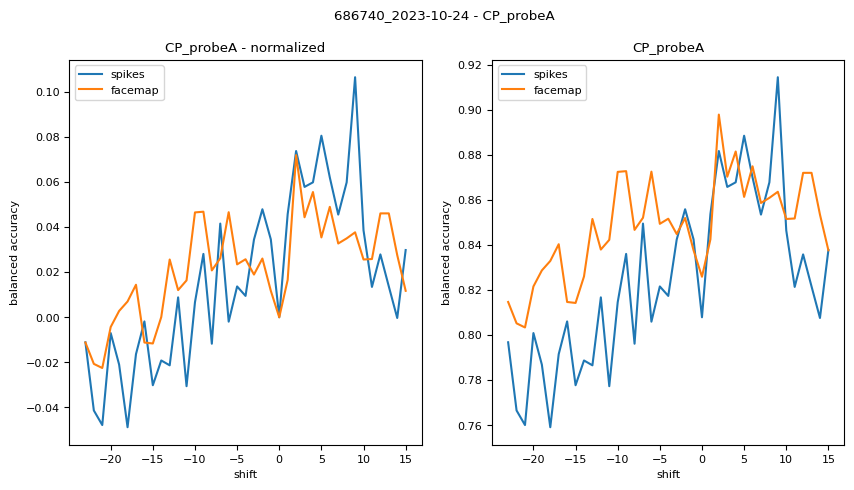

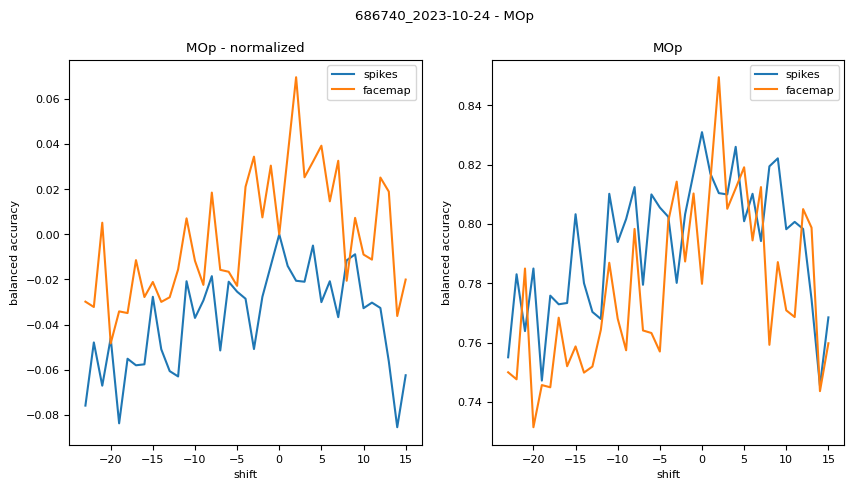

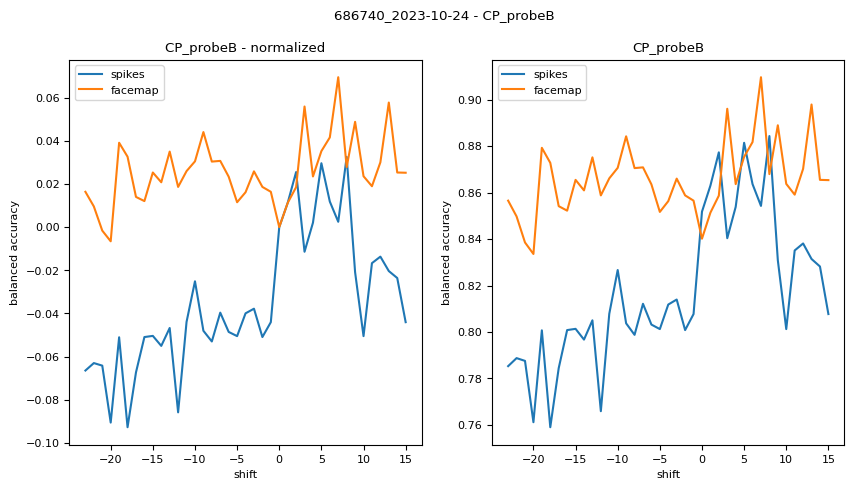

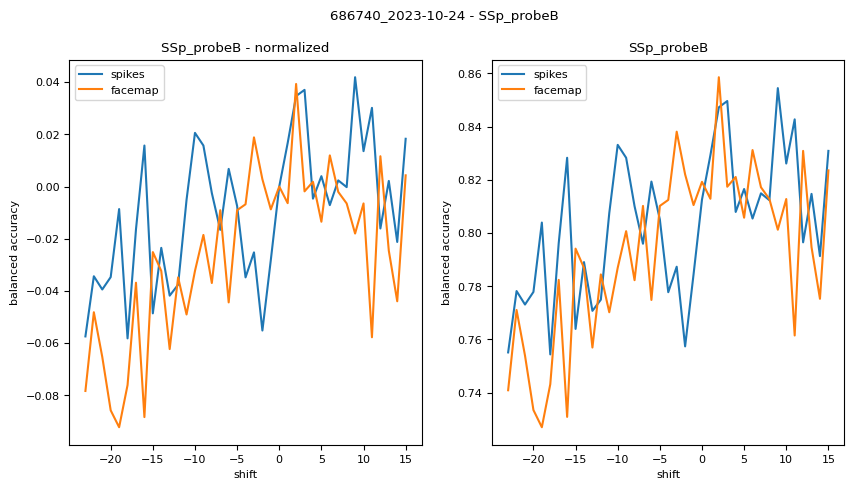

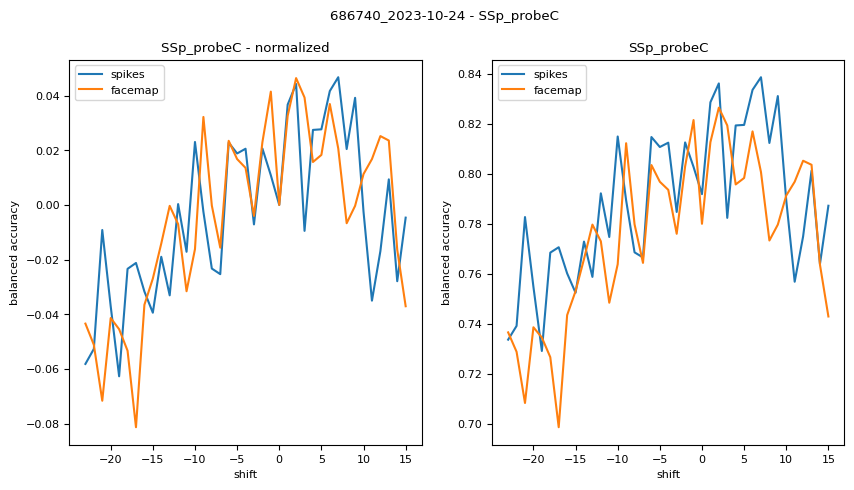

...

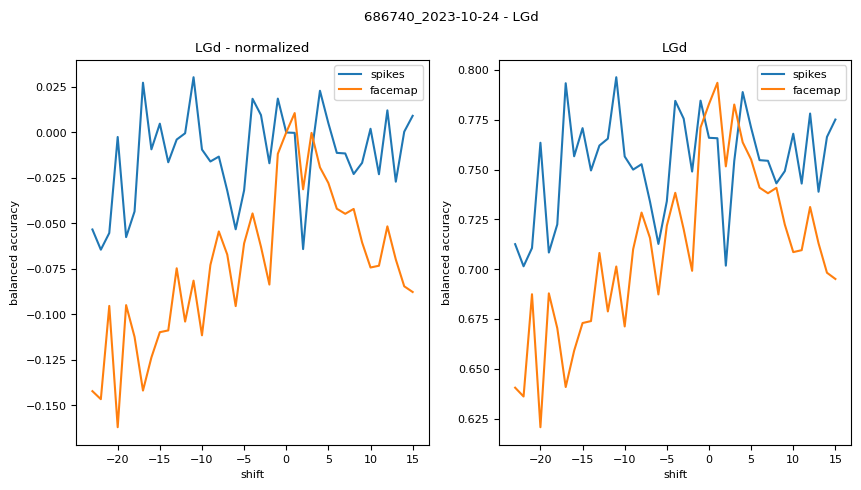

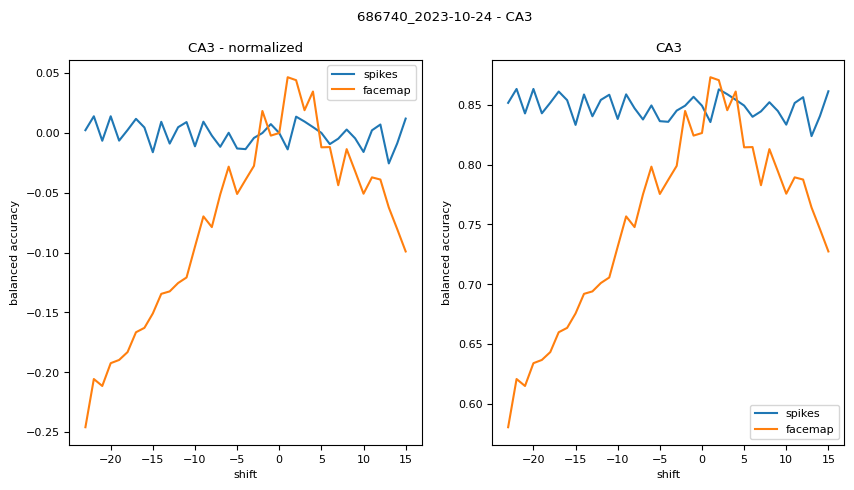

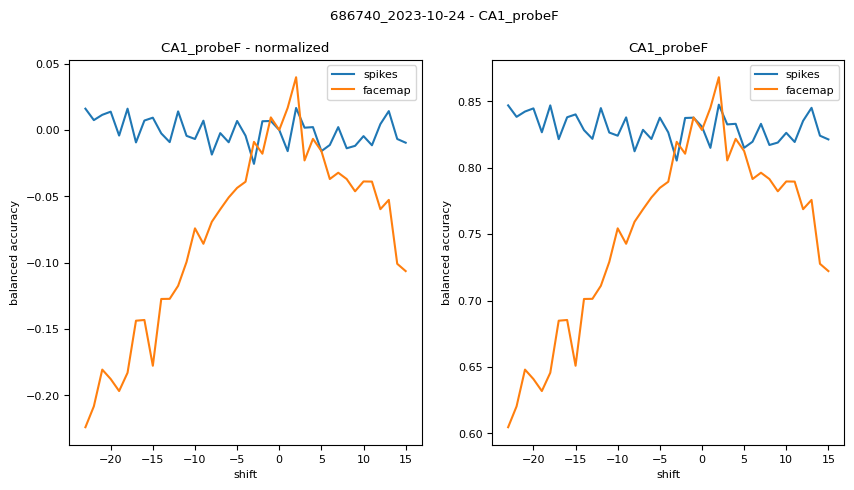

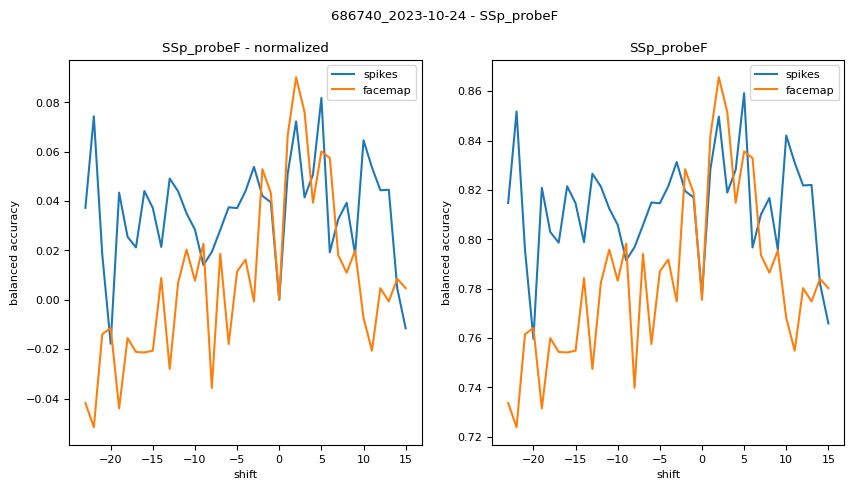

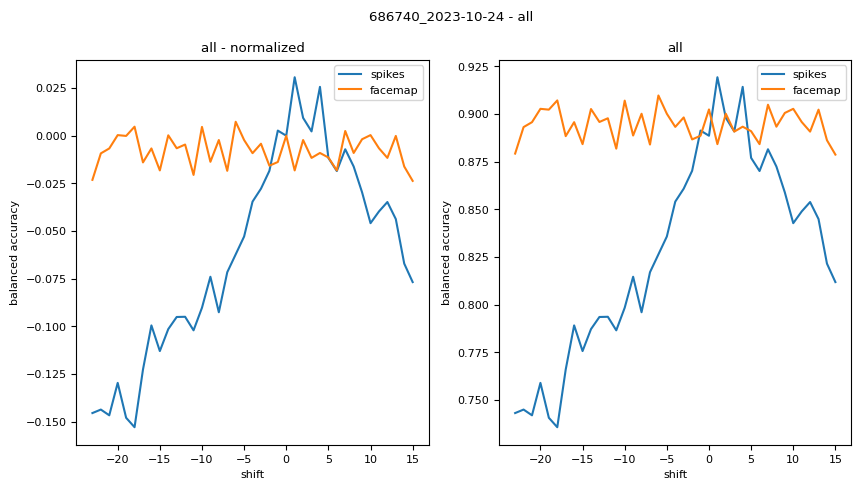

In [29]:
#select session
sel_session=68
all_sessions=shift_results['session'].unique()
session_results=shift_results.query('session==@all_sessions[@sel_session]')

#plot session results
for aa in session_results['area'].unique():
    fig,ax=plt.subplots(1,2,figsize=(10,5))
    ax[0].plot(xvect,session_results.query('area==@aa')['shift_spikes_norm'].values[0],label='spikes')
    ax[0].plot(xvect,session_results.query('area==@aa')['shift_facemap_norm'].values[0],label='facemap')
    ax[0].set_title(f'{aa} - normalized')
    ax[0].set_xlabel('shift')
    ax[0].set_ylabel('balanced accuracy')
    ax[0].legend()

    ax[1].plot(xvect,session_results.query('area==@aa')['shift_spikes'].values[0],label='spikes')
    ax[1].plot(xvect,session_results.query('area==@aa')['shift_facemap'].values[0],label='facemap')
    ax[1].set_title(f'{aa}')
    ax[1].set_xlabel('shift')
    ax[1].set_ylabel('balanced accuracy')
    ax[1].legend()

    fig.suptitle(f'{all_sessions[sel_session]} - {aa}')

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23760\3991267437.py:14: RuntimeWarning: Mean of empty slice
  spike_shift_norm_mean=np.nanmean(spike_shift_norm_all,axis=0)
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23760\3991267437.py:15: RuntimeWarning: Mean of empty slice
  facemap_shift_norm_mean=np.nanmean(facemap_shift_norm_all,axis=0)
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23760\3991267437.py:17: RuntimeWarning: All-NaN slice encountered
  spike_shift_norm_median=np.nanmedian(spike_shift_norm_all,axis=0)
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23760\3991267437.py:18: RuntimeWarning: All-NaN slice encountered
  facemap_shift_norm_median=np.nanmedian(facemap_shift_norm_all,axis=0)
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23760\3991267437.py:14

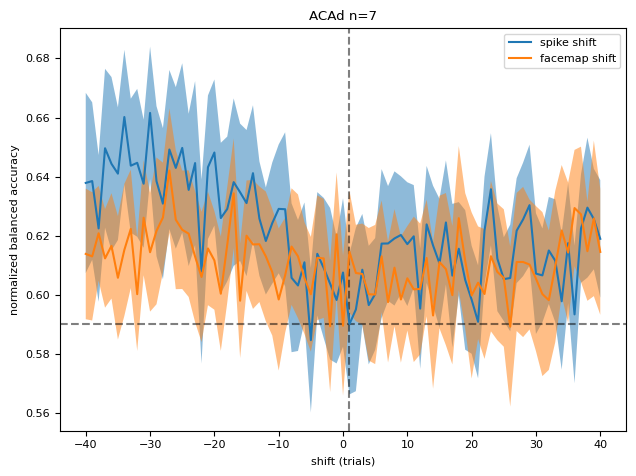

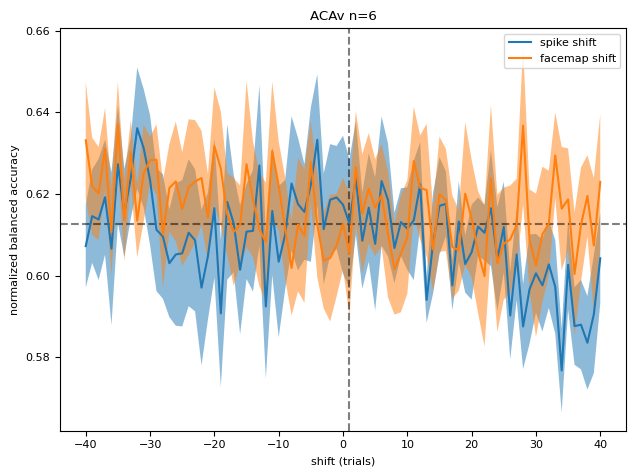

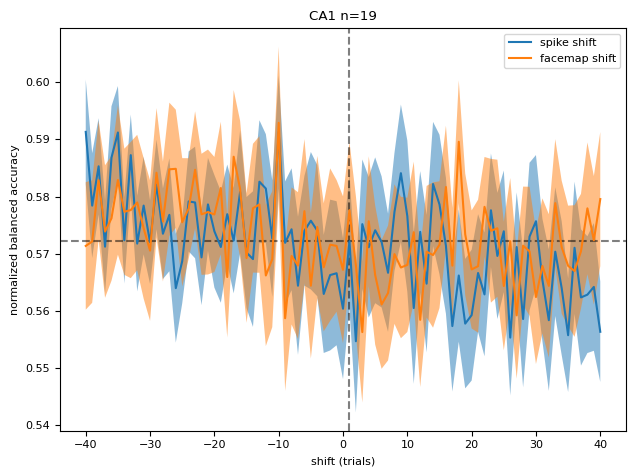

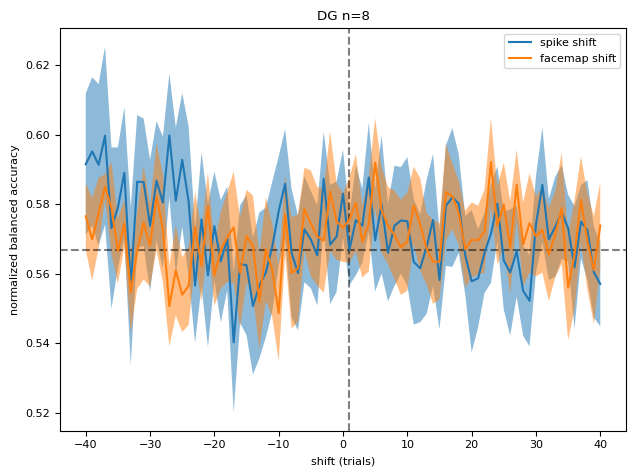

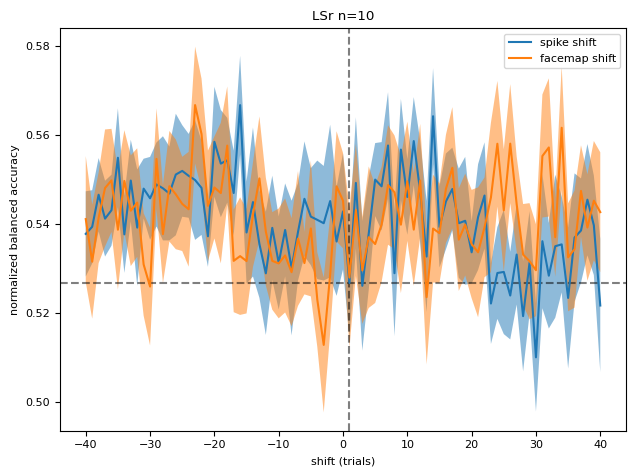

...

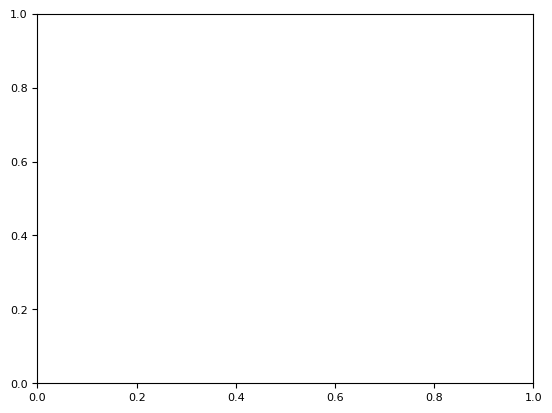

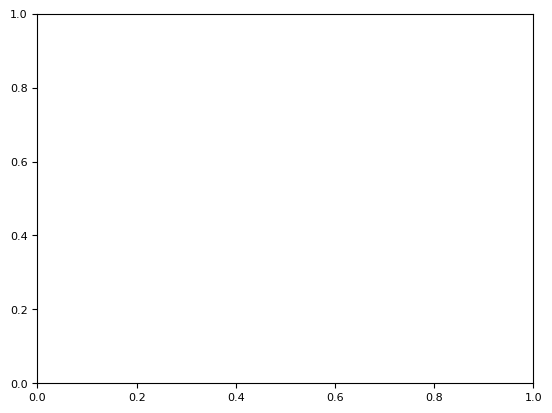

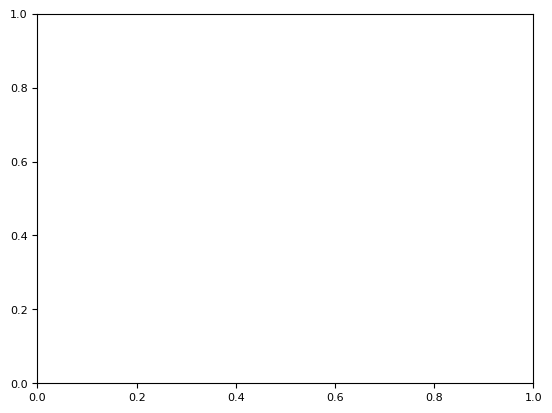

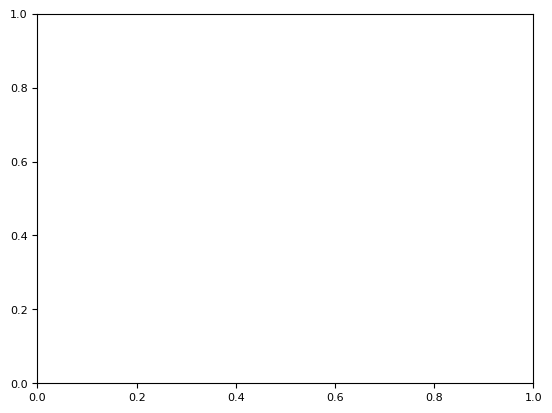

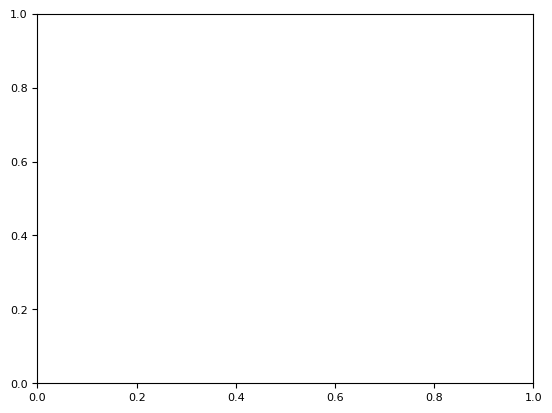

In [8]:
#plot average normalized spike shift and facemap shift across areas (w error bars)
sel_project='Templeton'

#loop through areas, average normalized shift
for aa in shift_results['area'].unique():
    fig,ax=plt.subplots(1,1)

    if len(shift_results.query('area==@aa and project.str.contains(@sel_project)'))==0:
        continue

    spike_shift_norm_all=np.vstack(shift_results.query('area.str.contains(@aa) and project.str.contains(@sel_project)')['shift_spikes'].values)
    facemap_shift_norm_all=np.vstack(shift_results.query('area.str.contains(@aa) and project.str.contains(@sel_project)')['shift_facemap'].values)

    spike_shift_norm_mean=np.nanmean(spike_shift_norm_all,axis=0)
    facemap_shift_norm_mean=np.nanmean(facemap_shift_norm_all,axis=0)

    spike_shift_norm_median=np.nanmedian(spike_shift_norm_all,axis=0)
    facemap_shift_norm_median=np.nanmedian(facemap_shift_norm_all,axis=0)

    spike_shift_norm_median[(xvect<-40)|(xvect>40)]=np.nan
    facemap_shift_norm_median[(xvect<-40)|(xvect>40)]=np.nan

    spike_shift_norm_sem=np.nanstd(spike_shift_norm_all,axis=0)/np.sqrt(spike_shift_norm_all.shape[0])
    facemap_shift_norm_sem=np.nanstd(facemap_shift_norm_all,axis=0)/np.sqrt(facemap_shift_norm_all.shape[0])

    # ax.axhline(0,color='k',linestyle='--',alpha=0.5)
    ax.axhline(spike_shift_norm_median[xvect==1],color='k',linestyle='--',alpha=0.5)
    ax.axvline(1,color='k',linestyle='--',alpha=0.5) 
    ax.plot(xvect,spike_shift_norm_median,label='spike shift')
    ax.fill_between(xvect,spike_shift_norm_median-spike_shift_norm_sem,spike_shift_norm_median+spike_shift_norm_sem,alpha=0.5)

    ax.plot(xvect,facemap_shift_norm_median,label='facemap shift')
    ax.fill_between(xvect,facemap_shift_norm_median-facemap_shift_norm_sem,facemap_shift_norm_median+facemap_shift_norm_sem,alpha=0.5)

    ax.set_xlabel('shift (trials)')
    ax.set_ylabel('normalized balanced accuracy')
    ax.legend()
    ax.set_title(aa + ' n='+str(spike_shift_norm_all.shape[0]))
    fig.tight_layout()


In [66]:
#compare DR and Templeton:
p_threshold=0.05

DR_linear_shift_df=shift_results.query('project=="DynamicRouting" and cross_modal_dprime>=1.0')

#diff from null
diff_from_null_DR={
    'area':[],
    'diff_from_null_spikes_mean_DR':[],
    'diff_from_null_spikes_median_DR':[],
    'true_accuracy_spikes_DR':[],
    'null_median_spikes_DR':[],
    'diff_from_null_facemap_mean_DR':[],
    'diff_from_null_facemap_median_DR':[],
    'true_accuracy_facemap_DR':[],
    'null_median_facemap_DR':[],
    'n_expts_DR':[],
}
for area in DR_linear_shift_df['area'].unique():
    diff_from_null_DR['area'].append(area)
    diff_from_null_DR['diff_from_null_spikes_mean_DR'].append((DR_linear_shift_df.query('area==@area')['true_accuracy_spikes']-
                                                    DR_linear_shift_df.query('area==@area')['null_accuracy_spikes_mean']).mean())
    diff_from_null_DR['diff_from_null_spikes_median_DR'].append((DR_linear_shift_df.query('area==@area')['true_accuracy_spikes']-
                                                    DR_linear_shift_df.query('area==@area')['null_accuracy_spikes_median']).median())
    diff_from_null_DR['true_accuracy_spikes_DR'].append(DR_linear_shift_df.query('area==@area')['true_accuracy_spikes'].median())
    diff_from_null_DR['null_median_spikes_DR'].append(DR_linear_shift_df.query('area==@area')['null_accuracy_spikes_median'].median())

    diff_from_null_DR['diff_from_null_facemap_mean_DR'].append((DR_linear_shift_df.query('area==@area')['true_accuracy_facemap']-
                                                    DR_linear_shift_df.query('area==@area')['null_accuracy_facemap_mean']).mean())
    diff_from_null_DR['diff_from_null_facemap_median_DR'].append((DR_linear_shift_df.query('area==@area')['true_accuracy_facemap']-
                                                    DR_linear_shift_df.query('area==@area')['null_accuracy_facemap_median']).median())
    diff_from_null_DR['true_accuracy_facemap_DR'].append(DR_linear_shift_df.query('area==@area')['true_accuracy_facemap'].median())
    diff_from_null_DR['null_median_facemap_DR'].append(DR_linear_shift_df.query('area==@area')['null_accuracy_facemap_median'].median())

    diff_from_null_DR['n_expts_DR'].append(len(DR_linear_shift_df.query('area==@area')))

diff_from_null_DR_df=pd.DataFrame(diff_from_null_DR)
diff_from_null_DR_df


Templeton_linear_shift_df=shift_results.query('project.str.contains("Templeton")')
#diff from null
diff_from_null_Templ={
    'area':[],
    'diff_from_null_spikes_mean_Templ':[],
    'diff_from_null_spikes_median_Templ':[],
    'true_accuracy_spikes_Templ':[],
    'null_median_spikes_Templ':[],
    'diff_from_null_facemap_mean_Templ':[],
    'diff_from_null_facemap_median_Templ':[],
    'true_accuracy_facemap_Templ':[],
    'null_median_facemap_Templ':[],
    'n_expts_Templ':[],
}
for area in Templeton_linear_shift_df['area'].unique():
    diff_from_null_Templ['area'].append(area)
    diff_from_null_Templ['diff_from_null_spikes_mean_Templ'].append((Templeton_linear_shift_df.query('area==@area')['true_accuracy_spikes']-
                                                    Templeton_linear_shift_df.query('area==@area')['null_accuracy_spikes_mean']).mean())
    diff_from_null_Templ['diff_from_null_spikes_median_Templ'].append((Templeton_linear_shift_df.query('area==@area')['true_accuracy_spikes']-
                                                    Templeton_linear_shift_df.query('area==@area')['null_accuracy_spikes_median']).median())
    diff_from_null_Templ['true_accuracy_spikes_Templ'].append(Templeton_linear_shift_df.query('area==@area')['true_accuracy_spikes'].median())
    diff_from_null_Templ['null_median_spikes_Templ'].append(Templeton_linear_shift_df.query('area==@area')['null_accuracy_spikes_median'].median())

    diff_from_null_Templ['diff_from_null_facemap_mean_Templ'].append((Templeton_linear_shift_df.query('area==@area')['true_accuracy_facemap']-
                                                    Templeton_linear_shift_df.query('area==@area')['null_accuracy_facemap_mean']).mean())
    diff_from_null_Templ['diff_from_null_facemap_median_Templ'].append((Templeton_linear_shift_df.query('area==@area')['true_accuracy_facemap']-
                                                    Templeton_linear_shift_df.query('area==@area')['null_accuracy_facemap_median']).median())
    diff_from_null_Templ['true_accuracy_facemap_Templ'].append(Templeton_linear_shift_df.query('area==@area')['true_accuracy_facemap'].median())
    diff_from_null_Templ['null_median_facemap_Templ'].append(Templeton_linear_shift_df.query('area==@area')['null_accuracy_facemap_median'].median())

    diff_from_null_Templ['n_expts_Templ'].append(len(Templeton_linear_shift_df.query('area==@area')))
diff_from_null_Templ_df=pd.DataFrame(diff_from_null_Templ)


all_diff_from_null_df=pd.merge(diff_from_null_DR_df,diff_from_null_Templ_df,on='area',how='outer')

In [ ]:
## summary plots - look at decoder accuracy above null median for spike shifts, also compare to facemap

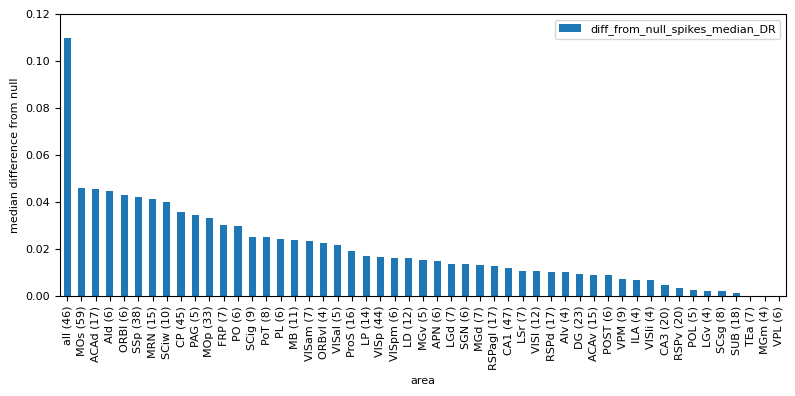

In [70]:
#barplot sorted by DR diff from median
min_n_expts=4

plot_DR_diff_from_null_df=diff_from_null_DR_df.query('n_expts_DR>=@min_n_expts').sort_values('diff_from_null_spikes_median_DR',ascending=False)
fig,ax=plt.subplots(1,1,figsize=(8,4))
plot_DR_diff_from_null_df.plot.bar(x='area',y=['diff_from_null_spikes_median_DR'],ax=ax)

ax.set_ylabel('median difference from null')
area_labels=[]
for i in range(plot_DR_diff_from_null_df.shape[0]):
    area_labels.append(plot_DR_diff_from_null_df['area'].iloc[i]+' ('+str(plot_DR_diff_from_null_df['n_expts_DR'].iloc[i])+')')
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylim([0,0.12])
fig.tight_layout()


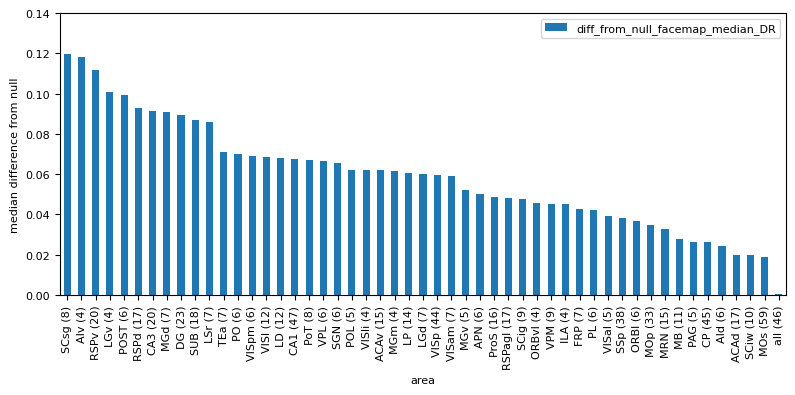

In [72]:
#barplot sorted by DR diff from median
min_n_expts=4

plot_DR_diff_from_null_df=diff_from_null_DR_df.query('n_expts_DR>=@min_n_expts').sort_values('diff_from_null_facemap_median_DR',ascending=False)
fig,ax=plt.subplots(1,1,figsize=(8,4))
plot_DR_diff_from_null_df.plot.bar(x='area',y=['diff_from_null_facemap_median_DR'],ax=ax)

ax.set_ylabel('median difference from null')
area_labels=[]
for i in range(plot_DR_diff_from_null_df.shape[0]):
    area_labels.append(plot_DR_diff_from_null_df['area'].iloc[i]+' ('+str(plot_DR_diff_from_null_df['n_expts_DR'].iloc[i])+')')
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylim([0,0.14])
fig.tight_layout()


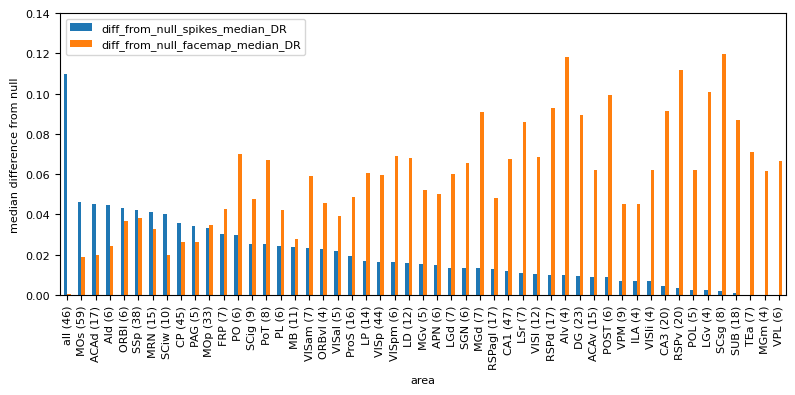

In [76]:
#barplot sorted by DR diff from median
min_n_expts=4

plot_DR_diff_from_null_df=diff_from_null_DR_df.query('n_expts_DR>=@min_n_expts').sort_values('diff_from_null_spikes_median_DR',ascending=False)
fig,ax=plt.subplots(1,1,figsize=(8,4))
plot_DR_diff_from_null_df.plot.bar(x='area',y=['diff_from_null_spikes_median_DR','diff_from_null_facemap_median_DR'],ax=ax)

ax.set_ylabel('median difference from null')
area_labels=[]
for i in range(plot_DR_diff_from_null_df.shape[0]):
    area_labels.append(plot_DR_diff_from_null_df['area'].iloc[i]+' ('+str(plot_DR_diff_from_null_df['n_expts_DR'].iloc[i])+')')
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylim([0,0.14])
fig.tight_layout()


In [1]:
#compare DR and Templeton:



In [ ]:
### change in decoding accuracy diff from mean - spikes alone vs spikes w/facemap, facemap alone vs facemap w/spikes

In [28]:
decoder_results[session_id].keys()

dict_keys(['shifts', 'middle_4_blocks', 'spikes_binsize', 'spikes_time_before', 'spikes_time_after', 'decoder_binsize', 'decoder_time_before', 'decoder_time_after', 'input_data_type', 'vid_angle', 'trials', 'results', 'areas'])

In [3]:
files[13]

'\\\\allen\\programs\\mindscope\\workgroups\\templeton\\TTOC\\decoding results\\linear_shift_spikes_and_facemap\\668755_2023-08-30_decoder_results.pkl'

In [20]:
decoder_results={}
for ii,ff in enumerate(files[16:17]):
    with open(ff,'rb') as f:
        data=pickle.load(f)
    decoder_results[ff.split('\\')[-1].split('_decoder')[0]]=data

In [21]:
session_id=list(decoder_results.keys())[0]

In [22]:
decoder_results[session_id].keys()

dict_keys(['shifts', 'middle_4_blocks', 'spikes_binsize', 'spikes_time_before', 'spikes_time_after', 'decoder_binsize', 'decoder_time_before', 'decoder_time_after', 'input_data_type', 'vid_angle', 'trials', 'results', 'areas'])

In [23]:
shifts=decoder_results[session_id]['shifts']
areas=decoder_results[session_id]['areas']

half_neg_shift=np.round(shifts.min()/2)
half_pos_shift=np.round(shifts.max()/2)
# half_shifts=np.arange(-half_neg_shift,half_pos_shift+1)
half_neg_shift_ind=np.where(shifts==half_neg_shift)[0][0]
half_pos_shift_ind=np.where(shifts==half_pos_shift)[0][0]
half_shift_inds=np.arange(half_neg_shift_ind,half_pos_shift_ind+1)

bal_acc_spike_shift={}
bal_acc_facemap_shift={}
for aa in areas:
    if aa in decoder_results[session_id]['results']:
        bal_acc_spike_shift[aa]=[]
        bal_acc_facemap_shift[aa]=[]
        for sh in half_shift_inds:
            bal_acc_spike_shift[aa].append(decoder_results[session_id]['results'][aa]['shift_spikes'][sh]['balanced_accuracy'])
            bal_acc_facemap_shift[aa].append(decoder_results[session_id]['results'][aa]['shift_facemap'][sh]['balanced_accuracy'])
        bal_acc_spike_shift[aa]=np.array(bal_acc_spike_shift[aa])
        bal_acc_facemap_shift[aa]=np.array(bal_acc_facemap_shift[aa])


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_22988\601176989.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(1,1)


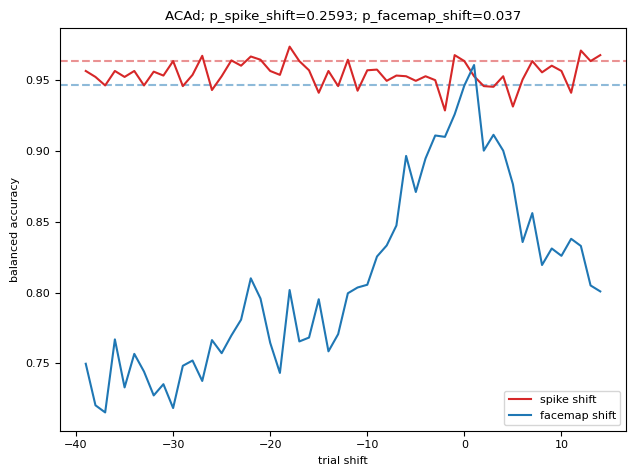

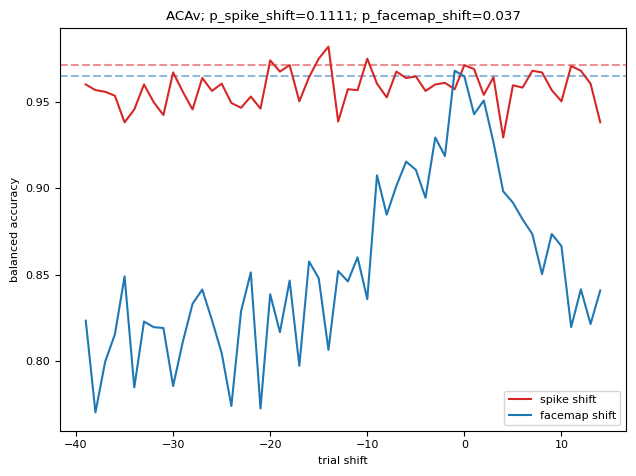

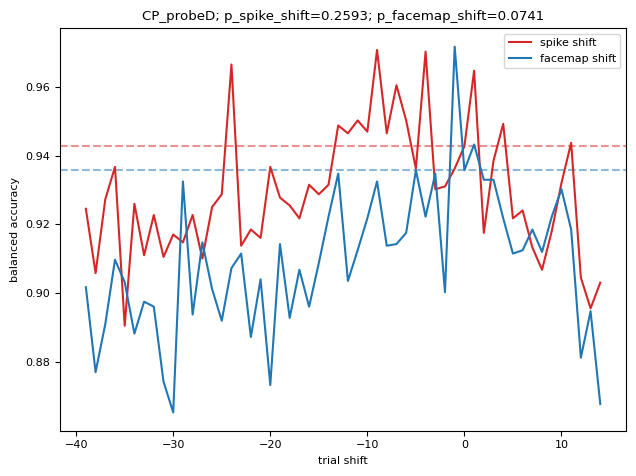

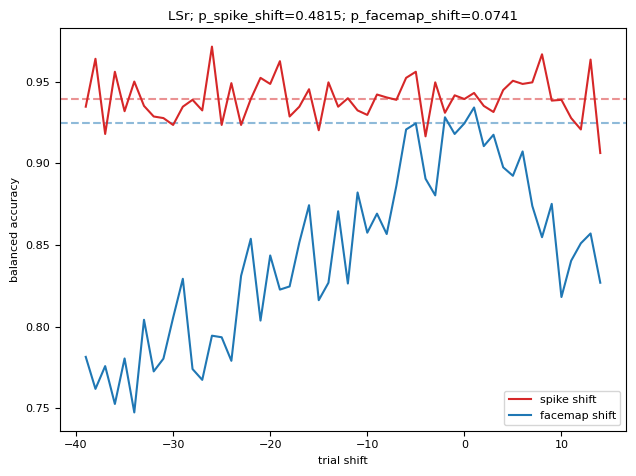

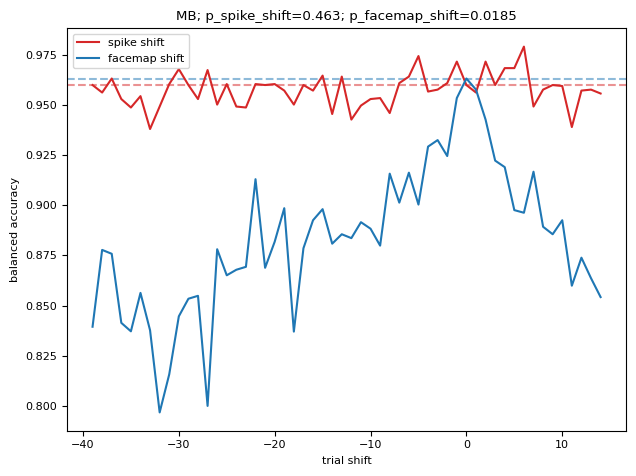

...

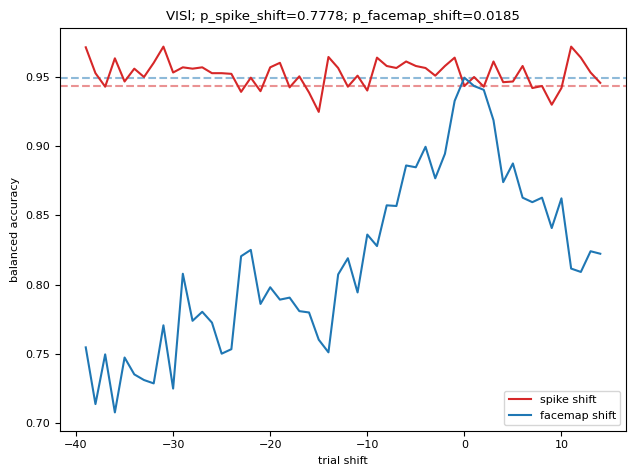

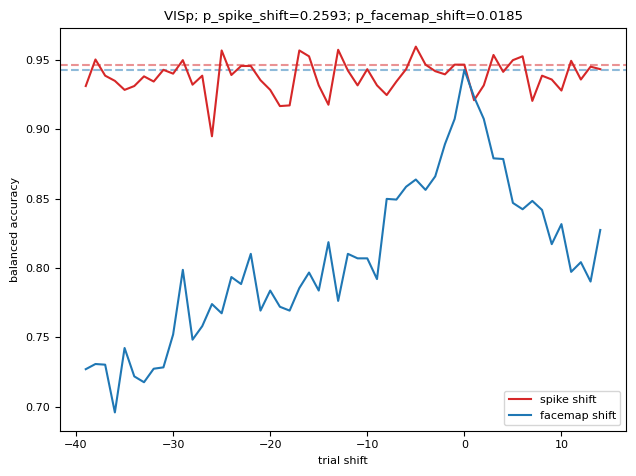

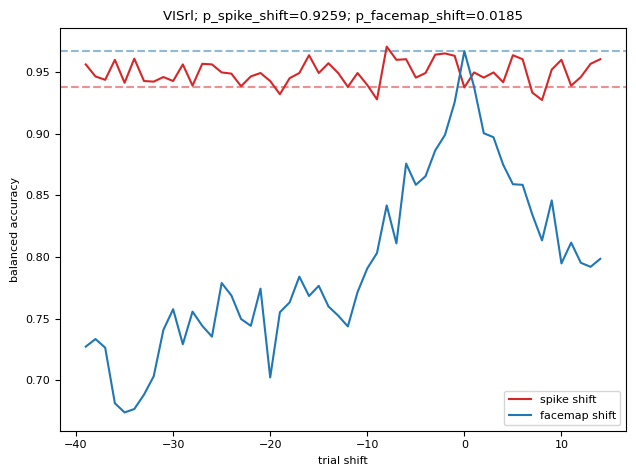

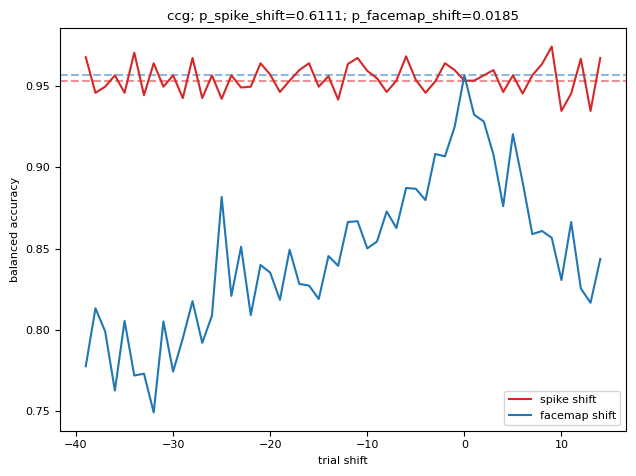

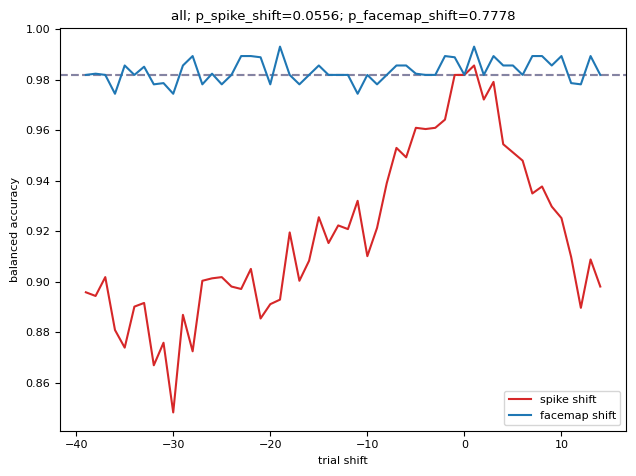

In [24]:
for aa in areas:
    if aa in decoder_results[session_id]['results']:
        true_acc_spike_shift=bal_acc_spike_shift[aa][shifts[half_shift_inds]==0]
        true_acc_facemap_shift=bal_acc_facemap_shift[aa][shifts[half_shift_inds]==0]
        pval_spike_shift=np.round(np.mean(bal_acc_spike_shift[aa]>=true_acc_spike_shift),decimals=4)
        pval_facemap_shift=np.round(np.mean(bal_acc_facemap_shift[aa]>=true_acc_facemap_shift),decimals=4)
        

        fig,ax=plt.subplots(1,1)
        ax.axhline(true_acc_spike_shift,color='tab:red',linestyle='--',alpha=0.5)
        ax.axhline(true_acc_facemap_shift,color='tab:blue',linestyle='--',alpha=0.5)
        # ax.plot(shifts,bal_acc[aa])
        ax.plot(shifts[half_shift_inds],bal_acc_spike_shift[aa],color='tab:red',label='spike shift')
        ax.plot(shifts[half_shift_inds],bal_acc_facemap_shift[aa],color='tab:blue',label='facemap shift')
        ax.set_xlabel('trial shift')
        ax.set_ylabel('balanced accuracy')
        # ax.set_title(aa+' n='+str(decoder_results[session_id]['results'][aa]['n_units'])+' p='+str(pval))
        ax.set_title(str(aa)+'; p_spike_shift='+str(pval_spike_shift)+'; p_facemap_shift='+str(pval_facemap_shift))
        ax.legend()
        fig.tight_layout()

        

In [ ]:
#summary plot idea:

#plot distance from median for each type of shift

#plot difference between spike and facemap shift median differences

#sort by this difference - which areas have more (or less) context information than facemap?